In [1]:
# from numba import jit
import numpy as np
import random
from matplotlib import pyplot as plt
from matplotlib import animation

In [2]:
def convert_labels(y: np.ndarray):
    """
    Convert labels to 1-hot encoding type

    Args:
        y (np.ndarray): array of labels
        C (int): total number of classes

    Example:
    y = [0,1,1,2,1]
    C = unique(y) = 3
    > Return Y=[[1,0,0],
                [0,1,0],
                [0,1,0],
                [0,0,1],
                [1,0,0]]

    """
    shape = (y.size, y.max()+1)
    output = np.zeros(shape)
    rows = np.arange(y.size)
    output[rows, y] = 1
    return output.T

In [3]:
def softmax(Z: np.ndarray):
    """
    Calculate probability of each class given input Z

    Args:
        Z (np.ndarray): feature vector of size (1x2)
        Z = W.X
    """
    e_Z = np.exp(Z - np.max(Z, axis=0, keepdims=True))
    A = e_Z / e_Z.sum(axis=0)
    return A

In [4]:
def loss(W: np.ndarray, X: np.ndarray, Y: np.ndarray):
    """
    Calculate loss value between W.X and Y using Log-loss function

    Args:
        W (np.ndarray): Weights matrix - updated after each training iteration
        X (np.ndarray): Feature input X
        Y (np.ndarray): Label Y
    """
    A = softmax(W.T.dot(X))
    return -np.sum(Y*np.log(A))

In [5]:
def grad(W, X, Y):
    A = softmax((W.T.dot(X)))
    E = A - Y
    return X.dot(E.T)

In [6]:
def display_samples(X, label):
    X0 = X[:, label==0]
    X1 = X[:, label==1]
    X2 = X[:, label==2]
    X3 = X[:, label==3]
    
    plt.plot(X0[0, :], X0[1, :], 'b^', markersize = 4, alpha = .8)
    plt.plot(X1[0, :], X1[1, :], 'go', markersize = 4, alpha = .8)
    plt.plot(X2[0, :], X2[1, :], 'rs', markersize = 4, alpha = .8)
    plt.plot(X3[0, :], X3[1, :], 'y*', markersize = 4, alpha = .8)

    # plt.axis('off')
    plt.plot()
    plt.show()

In [7]:
#Visualize 
def display_boundary(weights):
    xm = np.arange(-2, 11, 0.025)
    ym = np.arange(-3, 10, 0.025)
    xx, yy = np.meshgrid(xm, ym)

    xx1 = xx.ravel().reshape(1, xx.size)
    yy1 = yy.ravel().reshape(1, yy.size)
    # Make predictions on meshgrid points
    XX = np.concatenate((np.ones((1, xx.size)), xx1, yy1), axis = 0)

    # Make prediction with current weights
    A = softmax(weights.T.dot(XX))
    Z = np.argmax(A, axis=0)

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, 200, cmap='jet', alpha = .1)
    plt.xlim(-2, 11)
    plt.ylim(-3, 10)
    plt.xticks(())
    plt.yticks(())
    display_samples(X_sample[1:, :], y_sample)

    plt.show()

In [8]:
def gen_data(N: int):
    """
    Generate sample dataset

    Args:
        N (int): number of samples per class
    
    Returns:
        X: feature vectors of samples
        y: label vectors of samples
    """
    means = [[2, 2], [6, 2], [3, 6], [8,6]] # Centroids of clusters, each cluster is a class
    C = len(means) # number of classes
    cov = [[1, 0], [0, 1]] # Covariance matrix, must be a square matrix of size dxd and symmetric
    # Generate features
    X0 = np.random.multivariate_normal(means[0], cov, N)
    X1 = np.random.multivariate_normal(means[1], cov, N)
    X2 = np.random.multivariate_normal(means[2], cov, N)
    X3 = np.random.multivariate_normal(means[3], cov, N)

    X = np.concatenate((X0, X1, X2, X3), axis = 0).T # each column is a datapoint
    X = np.concatenate((np.ones((1, C*N)), X), axis = 0)
    # Generate labels
    y = np.asarray([0]*N + [1]*N + [2]*N + [3]*N).T 
    
    return X, y

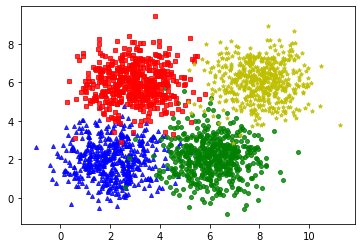

In [9]:
X_sample, y_sample = gen_data(500)
display_samples(X_sample[1:, :], y_sample)

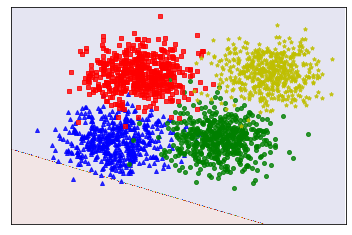

In [10]:
# Plot with randomly initialized weights
W_ini = np.random.randn(X_sample.shape[0], np.unique(y_sample).shape[0])
# print(W_ini.shape)
display_boundary(W_ini)


In [13]:
class Classifier:
    def __init__(self, eta=0.001, thresh=1e-4, steps=10_000):
        self.W = [] # Weights, set None as initial state
        self.eta = eta # Learning rate
        self.thresh = thresh # Max acceptable loss for early stopping
        self.steps = steps # Total training step


    def train(self, X:np.ndarray, y:np.ndarray, W_init:np.ndarray=None) -> np.ndarray:
        """
        Training function

        Args:
            W_init (np.ndarray): Initial weights of the model
            X (np.ndarray): feature vectors
            y (np.ndarray): true labels
        
        Return:
            W (np.ndarray): final weights of the model
        """
        d = X.shape[0] # Total umber of samples = C*N
        N = X.shape[1] # Number of dimensions
        C = np.unique(y).shape[0] # Total number of classes
        Y = convert_labels(y) # One-hot encoded labels
        
        if W_init is None: # Initiate weights if not predefined
            self.W.append(np.random.randn(d, C))
        else:
            self.W.append(W_init)
            
        step = 0
        step_per_checkpoint = 20
        while step < self.steps:
            mix_id = np.random.permutation(N) # Mix data up after each epoch to ensure random selection
            for i in mix_id:
                xi = X[:,i].reshape(d,1)
                yi = Y[:,i].reshape(C,1)
                ai = softmax(self.W[-1].T.dot(xi))
                W_new = self.W[-1] + self.eta*xi.dot((yi-ai).T)
                step += 1
                
                # Early stopping condition in which loss is below threshold
                if step%step_per_checkpoint == 0:
                    if np.linalg.norm(W_new - self.W[-step_per_checkpoint]) < self.thresh:
                        return self.W[-1]

                self.W.append(W_new)
            # Visualize model after each training epoch
            # display_boundary(self.W[-1]) # TODO
        return self.W[-1]


    def predict(self, X):
        A = softmax(self.W[-1].T.dot(X))
        return np.argmax(A, axis=0)

In [14]:
model = Classifier(steps=10_000_000) # Create classifier object
model.train(X_sample, y_sample, W_ini) # Start training model

array([[ 14.19456761,   1.4898892 ,  -0.51528096, -14.97171822],
       [ -2.69581575,   0.4570187 ,  -2.17875315,   1.24027934],
       [ -1.82076495,  -1.86573087,   1.51878697,   0.86510768]])

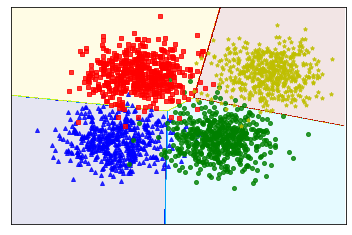

In [15]:
display_boundary(model.W[-1])

In [18]:
print(len(model.W))

3063060
